<img style="float: center;" src='https://github.com/STScI-MIRI/MRS-ExampleNB/raw/main/assets/banner1.png' alt="stsci_logo" width="1000px"/>

# NIRSpec MOS data reprocessing with the JWST pipeline

Updated March 2024 running JWST pipeline version 1.13.4 with CRDS context jwst_1217.pmap

## Table of Contents

* [Overview](#overview)
* [Observations](#observations)
* [JWST Pipeline](#pipeline)
* [Related Notebooks](#related)
* [Import Libraries](#import)
* [Download the data](#data)
* [Stage1: `Detector1Pipeline`](#stage1)
* [Stage2: `Spec2Pipeline`](#stage2)
* [Stage3: `Spec3Pipeline`](#stage3)
* [Change 1D extraction rows: `Extract1dStep`](#extract1d)

# Overview <a id='overview'></a>

Data from JWST observations are processed by the JWST pipeline and made available in MAST.
Outputs from any stage of the pipeline may be retrieved and reprocessed if desired.

There are some 
[known issues with NIRSpec MOS data products](https://jwst-docs.stsci.edu/jwst-calibration-pipeline-caveats/known-issues-with-jwst-data-products)
and with the 
[JWST pipeline run on NIRSpec MOS data](https://jwst-docs.stsci.edu/jwst-calibration-pipeline-caveats/jwst-nirspec-mos-pipeline-caveats)
using default settings.

This example notebook demonstrates reprocessing NIRSpec MOS data from 
["JWST's First Deep Field"](https://webbtelescope.org/contents/news-releases/2022/news-2022-035), 
[ERO program 2736](https://www.stsci.edu/cgi-bin/get-proposal-info?observatory=JWST&id=2736)
that observed SMACS0723 with NIRCam, NIRSpec, and MIRI.
We retrieve the uncalibrated `uncal` data from MAST, rerun all 3 stages of the pipeline, 
and compare the final output spectrum to the product in MAST
for one galaxy #6355 at z = 7.665 (observed 13.0 billion years ago).

When rerunning the pipeline on this NIRSpec MOS data, we make two key adjustments to input parameters:
* outlier rejection of cosmic rays and snowballs: `Detector1Pipeline` jump step 
* extraction rows for 1D spectrum (`x1d`) from 2D spectrum (`s2d`): `extract1d` [`ystart` – `ystop`]
    * This works well now for most sources observed with the standard 3 slitlets. 
    * Here we choose a source with 5 slitlets and make significant improvements.

## Observations <a id='observations'></a>

[ERO 2736](https://www.stsci.edu/cgi-bin/get-proposal-info?observatory=JWST&id=2736) NIRSpec MOS observations:

* two identical observations: 7, 8
* (Confirmation images after TA: 20 groups NRSIRS2RAPID = 306 s)
* G235M & G395M
* 3 slitlet nods x 2 integrations x 20 groups NRSIRS2 = 8841 s exposure time = 2.5 hours (in each grating and observation)

### Galaxies of interest
* **6355** z = 7.665 (13.0 Gyr ago)  
    * We'll look at this one in this notebook
    * excellent spectrum with bright lines
    * 5 slitlets in a row (rather than standard 5), so 1D extraction can be improved significantly
    * not a multiple image of 10612 below at similar redshift
* 5144 z = 6.383
  
[featured in the press release](https://webbtelescope.org/contents/news-releases/2022/news-2022-035):
*  4590 z = 8.498 (13.1 Gyr ago)  
* 10612 z = 7.663 (13.0 Gyr ago)  
*  8140 z = 5.275 (12.6 Gyr ago)  
*  9922 z = 2.743 (11.3 Gyr ago)  

and presented and studied in papers including 
[Katz et al. 2023](https://ui.adsabs.harvard.edu/abs/2023MNRAS.518..592K), 
[Curti et al. 2023](https://ui.adsabs.harvard.edu/abs/2023MNRAS.518..425C), 
[Carnall et al. 2023](https://ui.adsabs.harvard.edu/abs/2023MNRAS.518L..45C)


# JWST Science Calibration Pipeline <a id='pipeline'></a>
**JWST Pipeline**
[JDox](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview) • 
[ReadtheDocs](https://jwst-pipeline.readthedocs.io) • 
[Github](https://github.com/spacetelescope/jwst) •
`pip install jwst`

Below we summarize the various pipeline stages and data products.

[**Data Products**](https://jwst-pipeline.readthedocs.io/en/latest/jwst/data_products/science_products.html)
(also see [JDox](https://jwst-docs.stsci.edu/getting-started-with-jwst-data/understanding-jwst-data-files/jwst-data-products))  

`uncal` (counts) –> `rate` (slopes) –> `cal` (extracted calibrated 2D spectra) –> `s2d` (rectified 2D spectra) –> `x1d` (1D spectra)

[Retrieve data from MAST](https://outerspace.stsci.edu/display/MASTDOCS/API+Advanced+Search)
(also see [ReadtheDocs](https://astroquery.readthedocs.io/en/latest/mast/mast_obsquery.html))

`uncal` uncalibrated data saved from every detector readout

[**JWST Pipeline Stages**](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing)
(also see [ReadtheDocs](https://jwst-pipeline.readthedocs.io/en/stable/jwst/pipeline/main.html))

[**Stage 1**](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_detector1):
[calwebb_detector1](https://jwst-pipeline.readthedocs.io/en/stable/jwst/pipeline/calwebb_detector1.html)
[`Detector1Pipeline`](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.pipeline.Detector1Pipeline.html)

Detector corrections for flat field, artifacts, etc., followed by ramp fitting to slopes (count rates)  
`rate` count rate (slope) averaged over multiple integrations, if available  
`rateints` count rates for each individual integration (saved in multiple extensions)

[**Stage 2**](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_spec2):
[calwebb_spec2](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec2.html)
[`Spec2Pipeline`](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.pipeline.Spec2Pipeline.html)

Extracted calibrated spectra for each source from each exposure (or association) and each detector, including any corrections for slit loss, path loss, and bar shadows.
Slits or exposures defined as background will have negative spectra.
Each source will be an extension in the file:  
`cal` / `calints` calibrated 2D (unrectified) spectra (flux vs. wavelength)  
`crf` / `crfints` cosmic ray flagged data, identical to `cal` products with updated DQ arrays  
`s2d` 2D spectra resampled (rectified) to a rectangle  
`x1d` 1D spectra extracted from rows of 2D spectrum

[**Stage 3**](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_spec3):
[calwebb_spec3](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec3.html)
[`Spec3Pipeline`](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.pipeline.Spec3Pipeline.html)

Extracted calibrated spectra for each source:  
`cal` / `calints` identical to Stage 2 outputs, repackaged for each source (multiple extensions for each exposure and detector)  
`crf` / `crfints` cosmic ray flagged data, identical to `cal` products with updated DQ arrays  
spectra combined from multiple exposures, including background subtraction:
`s2d` 2D spectra resampled (rectified) to a rectangle  
`x1d` 1D spectra extracted from rows of 2D spectrum

Note these filenames will have the same extensions (`cal`, `s2d`, `x1d`, etc.) but have different structures depending on which stage they are output from:
* Stage 2: one file from each exposure (or association) and detector; one extension for each source
* Stage 3: one file for each source; `cal`: one extension for each exposure (or association) and detector

# Related Notebooks <a id='related'></a>


* [NIRSpec MOS pipeline caveats](https://jwst-docs.stsci.edu/jwst-calibration-pipeline-caveats/jwst-nirspec-mos-pipeline-caveats)
and workaround notebooks for 
[general NIRSpec](https://github.com/spacetelescope/jwst-caveat-examples/tree/main/NIRSPEC_General)
data and
[NIRSpec MOS](https://github.com/spacetelescope/jwst-caveat-examples/tree/main/NIRSPEC_MOS)
* Notebooks running pipeline on [NIRSpec fixed slit data](coming soon) and
[BOTS data](https://github.com/exonik/JWebbinar2023-TSO)
* Notebooks running pipeline on simulated NIRSpec MOS data:
[JWebbinar7 (Oct 2021)](https://github.com/spacetelescope/jwebbinar_prep/blob/webbinar7/mos_session/jwebbinar7_nirspecmos.ipynb) •
[JDAT (2021)](https://github.com/spacetelescope/dat_pyinthesky/blob/main/jdat_notebooks/mos-spectroscopy/MOSspec_sv06_revised.ipynb) •
[JADES (June 2022)](https://github.com/eclake/NIRSpec_GTO_sims_STScI_reduction/blob/master/NIRSpec%20GTO%20IPS%20Simultions.ipynb)
* [Notebook processing ERO SMACS0723 NIRSpec MOS data](https://github.com/gbrammer/msaexp/blob/main/docs/examples/process-smacs0723.ipynb)
using the JWST pipeline and 
[msaexp](https://github.com/gbrammer/msaexp)
* [MOSViz notebook analyzing NIRSpec MOS spectra](https://spacetelescope.github.io/jdat_notebooks/notebooks/mos_spectroscopy_advanced/MOSspec_advanced.html)
* [JDAT: JWST Data Analysis Example Notebooks](https://jwst-docs.stsci.edu/jwst-post-pipeline-data-analysis/data-analysis-example-jupyter-notebooks)

# Import Libraries <a id='import'></a>

In [1]:
import os
home = os.path.expanduser("~")
from glob import glob
import numpy as np
from astropy.io import fits

In [2]:
# Define CRDS paths *before* importing jwst pipeline
# otherwise you'll get FileNotFoundError: [Errno 2] : No such file or directory: '$HOME/crds_cache/config/jwst/server_config'

#os.environ["CRDS_PATH"] = "$HOME/crds_cache"
#os.environ["CRDS_PATH"] = '/grp/crds/cache/' at STScI
os.environ["CRDS_PATH"] = os.path.join(home, "crds_cache")
os.makedirs(os.environ['CRDS_PATH'], exist_ok=True)
print(os.environ['CRDS_PATH'])

os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"

import crds

/Users/dcoe/crds_cache


In [3]:
# Import JWST pipeline 

import jwst
from jwst import datamodels
from jwst.pipeline import Detector1Pipeline   # calwebb_detector1
from jwst.pipeline import Spec2Pipeline       # calwebb_spec2
from jwst.pipeline import Spec3Pipeline       # calwebb_spec3
from jwst.extract_1d import Extract1dStep     # Extract1D Individual Step
from jwst.associations import asn_from_list   # create association file
import json

print("JWST Calibration Pipeline Version = {}".format(jwst.__version__)) 
# Note if you're using a development version, it might not report the correct version number here

JWST Calibration Pipeline Version = 1.13.4


In [4]:
try:
    print("Current Operational CRDS Context = {}".format(crds.get_default_context()))
except:
    print('CRDS server not found (are you offline?)')

Current Operational CRDS Context = jwst_1217.pmap


In [5]:
# To run faster on multiple cores in parallel
import multiprocessing as mp 
print("Number of processors: ", mp.cpu_count())

Number of processors:  10


In [6]:
# To retrieve data from MAST
import astroquery
print('astroquery version', astroquery.__version__)
from astroquery.mast import Observations, Mast

from astropy.table import Table, vstack, unique

astroquery version 0.4.6


In [7]:
# To plot and view results

import matplotlib # as mpl
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 14})  # 18

from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
import matplotlib.patheffects as pe # https://stackoverflow.com/questions/25426599/matplotlib-how-to-buffer-label-text

from astropy.visualization import simple_norm, ImageNormalize, AsinhStretch, ManualInterval, LogStretch, LinearStretch
from astropy.stats import sigma_clip, sigma_clipped_stats  # , SigmaClip

In [8]:
# Define colormap
#cmap = 'viridis'
#bad_color = 1, 0.7, 0.7
#bad_color = 'r'  # color used for nan values
#cmap = matplotlib.colormaps[cmap]
#cmap.set_bad(bad_color, 1.)

In [9]:
from IPython.display import JSON  # nicer interactive output of JSON dictionaries

def print_dict(d, indent=0): # another way to view dictionary contents
    for key in d.keys():
        val = d[key]
        try:
            keys = val.keys()
            print(' ' * indent, key)
            print_dict(val, indent+4)
        except:
            if type(val) == type([]):
                for i, item in enumerate(val):
                    print(' ' * indent, '[%d]' % i)
                    print_dict(item, indent+4)
            else:
                print(' ' * indent, key, ':', d[key])

In [10]:
def between(lo, x, hi):
    return (lo <= x) * (x <= hi)

# Set up data directories

In [11]:
download_dir = 'data'  # directory name for files you download from MAST
os.makedirs(download_dir, exist_ok=True)  # create directory

In [12]:
output_dir = 'reprocess'  # directory name for results from rerunning pipeline
os.makedirs(output_dir, exist_ok=True)  # create directory

In [13]:
run_pipeline = False  # if False, already ran the pipeline; just load and show the results

# Download UNCAL files: Query and retrieve from MAST archive <a id='data'></a> 

[Astroquery](https://astroquery.readthedocs.io)
• [Downloading data](https://astroquery.readthedocs.io/en/latest/mast/mast_obsquery.html#downloading-data)
• [Observations Class](https://astroquery.readthedocs.io/en/latest/api/astroquery.mast.ObservationsClass.html)

[MAST JWST](https://mast.stsci.edu/search/ui/#/jwst)
• [API Advanced Search](https://outerspace.stsci.edu/display/MASTDOCS/API+Advanced+Search)
• [Products Field Descriptions](https://mast.stsci.edu/api/v0/_productsfields.html)

In [14]:
# Helper function to download JWST files from MAST
def download_jwst_files(filenames, download_dir, mast_dir='mast:jwst/product'):
    # Download data
    #manifest = Observations.download_products(chosen_obsIDs, download_dir=DOWNLOAD_DIR)  # , flat=True

    downloaded_files = []
    os.makedirs(download_dir, exist_ok=True)
    for filename in filenames:
        filename   = os.path.basename(filename)
        mast_path  = os.path.join(mast_dir,     filename)
        local_path = os.path.join(download_dir, filename)
        if os.path.exists(local_path):
            print(local_path, 'EXISTS')
        else:
            # Can let this command check if local file exists
            # However, it will delete it if it's there and the wrong size (e.g., reprocessed)
            Observations.download_file(mast_path,   local_path=local_path)
        downloaded_files.append(local_path)

    return downloaded_files

In [15]:
# Helper functions to select subset of files from list
def allin(elements, list_or_string):
    if type(elements) == str:
        elements = elements.split()
    for element in elements:
        if element not in list_or_string:
            return False
    return True

def anyin(elements, list_or_string):
    if type(elements) == str:
        elements = elements.split()
    for element in elements:
        if element in list_or_string:
            return True
    return False

# Select subset of files containing all search strings
def select_files(all_files, search_strings=[]):
    chosen_files = [file for file in all_files if allin(search_strings, file)]
    if len(chosen_files) == 1:
        chosen_files = chosen_files[0]
    return chosen_files    

In [16]:
#Observations.get_metadata("products")  # list all possible keyword filters

In [17]:
uncal_files = glob(os.path.join(download_dir, '*_uncal.fits'))  # find files already downloaded

# Download files from MAST if you haven't already
# Could also let this run to check for all files. But the MAST query takes a minute.
if len(uncal_files) == 0:
    obs_table = Observations.query_criteria(obs_collection = 'JWST', 
                                            proposal_id = 2736,  # program number 2736: ERO SMACS0723
                                            instrument_name = 'NIRSPEC/MSA',
                                            filters = 'g395m',
                                            dataproduct_type = 'spectrum',
                                           )
    
    products_list = Observations.get_product_list(obs_table)  # all output products including images, catalogs, etc.
    
    data_products = Observations.filter_products(products_list, 
                                                productType = 'SCIENCE', 
                                                productSubGroupDescription = 'UNCAL',  # UNCAL, RATE[INTS], CAL[INTS], I2D, S2D, X1D, ASN
                                                )  

    #data_products  # list files retrieved from MAST

In [18]:
uncal_files = sorted(uncal_files)
# Remove TA confirmation files (they'll have EXP_TYPE = NRS_CONFIRM, whereas science exposures have NRS_MSASPEC)
uncal_files = [file for file in uncal_files if 'CONFIRM' not in fits.open(file)[0].header['EXP_TYPE']]

In [19]:
uncal_files  # Final list of UNCAL files ready for Stage 1 processing

['data/jw02736007001_03103_00001_nrs1_uncal.fits',
 'data/jw02736007001_03103_00001_nrs2_uncal.fits',
 'data/jw02736007001_03103_00002_nrs1_uncal.fits',
 'data/jw02736007001_03103_00002_nrs2_uncal.fits',
 'data/jw02736007001_03103_00003_nrs1_uncal.fits',
 'data/jw02736007001_03103_00003_nrs2_uncal.fits',
 'data/jw02736008001_03103_00001_nrs1_uncal.fits',
 'data/jw02736008001_03103_00001_nrs2_uncal.fits',
 'data/jw02736008001_03103_00002_nrs1_uncal.fits',
 'data/jw02736008001_03103_00002_nrs2_uncal.fits',
 'data/jw02736008001_03103_00003_nrs1_uncal.fits',
 'data/jw02736008001_03103_00003_nrs2_uncal.fits']

# Stage 1 `Detector1Pipeline`: `uncal` –> `rate`  <a id='stage1'></a> 

`calwebb_detector1`
[JDox](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_detector1) •
[ReadtheDocs](https://jwst-pipeline.readthedocs.io/en/stable/jwst/pipeline/calwebb_detector1.html)

Detector corrections for flat field, artifacts, etc., followed by ramp fitting to slopes (count rates)

### View available options and default parameters 

OPTIONAL: You'll call `Detector1Pipeline` differently below

In [20]:
det1 = Detector1Pipeline()

2024-03-28 15:07:28,281 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.
2024-03-28 15:07:28,282 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.
2024-03-28 15:07:28,283 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.
2024-03-28 15:07:28,284 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.
2024-03-28 15:07:28,285 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.
2024-03-28 15:07:28,286 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.
2024-03-28 15:07:28,287 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.
2024-03-28 15:07:28,288 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.
2024-03-28 15:07:28,289 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.
2024-03-28 15:07:28,290 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.
2024-03-28 15:07

In [21]:
det1.__dict__.keys()  # view keywords for top-level parameters you may change
# Note you may also view the values, but these may not be the latest in CRDS. Those will be updated by .call()

dict_keys(['_reference_files_used', '_log_records', '_input_filename', '_input_dir', '_keywords', 'name', 'qualified_name', 'parent', 'pre_hooks', 'post_hooks', 'output_file', 'output_dir', 'output_ext', 'output_use_model', 'output_use_index', 'save_results', 'skip', 'suffix', 'search_output_file', 'save_calibrated_ramp', 'steps', 'log', 'config_file', '_pre_hooks', '_post_hooks', 'group_scale', 'dq_init', 'emicorr', 'saturation', 'ipc', 'superbias', 'refpix', 'rscd', 'firstframe', 'lastframe', 'linearity', 'dark_current', 'reset', 'persistence', 'charge_migration', 'jump', 'ramp_fit', 'gain_scale'])

In [22]:
det1.jump.__dict__.keys()  # view jump step parameter values you may change
# Note you may also view the values, but these may not be the latest in CRDS. Those will be updated by .call()

dict_keys(['_reference_files_used', '_log_records', '_input_filename', '_input_dir', '_keywords', 'name', 'qualified_name', 'parent', 'pre_hooks', 'post_hooks', 'output_file', 'output_dir', 'output_ext', 'output_use_model', 'output_use_index', 'save_results', 'skip', 'suffix', 'search_output_file', 'rejection_threshold', 'three_group_rejection_threshold', 'four_group_rejection_threshold', 'maximum_cores', 'flag_4_neighbors', 'max_jump_to_flag_neighbors', 'min_jump_to_flag_neighbors', 'after_jump_flag_dn1', 'after_jump_flag_time1', 'after_jump_flag_dn2', 'after_jump_flag_time2', 'expand_large_events', 'min_sat_area', 'min_jump_area', 'expand_factor', 'use_ellipses', 'sat_required_snowball', 'min_sat_radius_extend', 'sat_expand', 'edge_size', 'find_showers', 'extend_snr_threshold', 'extend_min_area', 'extend_inner_radius', 'extend_outer_radius', 'extend_ellipse_expand_ratio', 'time_masked_after_shower', 'max_extended_radius', 'minimum_groups', 'minimum_sigclip_groups', 'only_use_ints', '

### Input parameters
* [ramp fitting](https://jwst-pipeline.readthedocs.io/en/latest/jwst/ramp_fitting/arguments.html) (count rate slopes)  
* [jump step](https://jwst-pipeline.readthedocs.io/en/latest/jwst/jump/arguments.html) (including rejections of cosmic rays, snowballs, etc.)

CEERS NIRSpec reduction parameters to improve jump step rejection of cosmic rays and snowballs  
https://web.corral.tacc.utexas.edu/ceersdata/DR07/NIRSpec/README_NIRSpec_DR0.7.txt

In [23]:
params_det1 = {}
params_det1['jump'] = {  # https://jwst-pipeline.readthedocs.io/en/latest/jwst/jump/arguments.html
    'expand_large_events': True,
    'expand_factor':  3.0,  # default 2
    'min_sat_area':  15.0,  # default 1
    'min_jump_area': 15.0,  # default 5
    'maximum_cores': 'half',  # integer, 'quarter', 'half', 'all' -- run N times faster using N multiprocessors
}
params_det1['ramp_fit'] = {   # https://jwst-pipeline.readthedocs.io/en/latest/jwst/ramp_fitting/arguments.html
    'maximum_cores': 'half',  # integer, 'quarter', 'half', 'all' -- run N times faster using N multiprocessors
}

params_det1

{'jump': {'expand_large_events': True,
  'expand_factor': 3.0,
  'min_sat_area': 15.0,
  'min_jump_area': 15.0,
  'maximum_cores': 'half'},
 'ramp_fit': {'maximum_cores': 'half'}}

### Run `Detector1Pipeline`

In [24]:
if run_pipeline:
    for uncal_file in sorted(uncal_files): 
        print('*' * 77)
        print(uncal_file)
        #print(os.path.basename(uncal_file))
        
        det1_result = Detector1Pipeline.call(
            uncal_file,
            save_results = True,
            output_dir = output_dir,
            steps = params_det1)

Note we run the pipeline using `.call()` instead of `.run()` to ensure we're using the latest default parameters from CRDS

https://jwst-pipeline.readthedocs.io/en/latest/jwst/stpipe/call_via_run.html

In [25]:
# Print output result details:
#det1_result.__dict__  # view entire contents
#det1_result.meta.filename
#det1_result.data.shape

## Show rate file

In [26]:
def show_MOS_rate(rate_file, slits_model=None,
                  save_plot=False, close_plot=False, integration=None,
                  cmap='viridis', bad_color=(1,0.7,0.7), vmin=-0.003, vmax=0.022, show_colorbar=True,
                  title_prefix=None, title_path=False):
    
    with fits.open(rate_file) as hdu_list:
        data = hdu_list['SCI'].data
        if integration == 'min':
            data = data.min(axis=0)
        elif integration != None:
            data = data[integration]
        
    cmap = matplotlib.colormaps[cmap]
    cmap.set_bad(bad_color, 1.)

    fig, ax = plt.subplots(1, 1, figsize=(12,12))
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())    
    im  = ax.imshow(data, origin='lower', cmap=cmap, norm=norm, interpolation='nearest')    

    if slits_model != None:  # draw slits and label source ids
        # slits_model can be either s2d or cal from spec2 -- contains slit models for all the sources

        #path_effects=[pe.withStroke(linewidth=3, foreground="w", alpha=0.9)]  # add white outline to text below
        #fontsize = 12
        #color = 'r'

        path_effects = []  # no outline
        fontsize = 7
        color = 'w'

        slit_patches = []
        for slit in slits_model.slits:
            slit_patch = Rectangle((slit.xstart, slit.ystart), slit.xsize, slit.ysize)
            slit_patches.append(slit_patch)
            y = slit.ystart + slit.ysize/2
            va = 'center'
            if 'nrs1' in rate_file: # Label the spectra on the left hand side for NRS1:
                x = slit.xstart
                ha = 'right'
            else: # Label the spectra on the right hand side for NRS2: 
                x = slit.xstart + slit.xsize
                ha = 'left'
            plt.text(x, y, slit.source_id, color=color, ha=ha, va=va, fontsize=fontsize, path_effects=path_effects, weight='bold')

        ax.add_collection(PatchCollection(slit_patches, ec='r', fc='None'))

    if title_prefix:
        title = title_prefix + '  '
    else:
        title = ''

    if title_path:
        title += rate_file
    else:
        title += os.path.basename(rate_file)
    
    if integration != None:
        title = title.replace('rateints', 'rateints[%s]' % integration)

    plt.title(title)
    print(title)

    if show_colorbar:
        plt.subplots_adjust(left=0.05, right=0.85)

        units = 'DN/s'
        # https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
        cbar_dx = 0.02
        cbar_ax = fig.add_axes([ax.get_position().x1+cbar_dx, ax.get_position().y0, cbar_dx, ax.get_position().height])
        #cbar_ax = fig.add_axes([ax.get_position().x1-cbar_dx, ax.get_position().y0, cbar_dx, ax.get_position().height])
        cbar = fig.colorbar(im, label=units, cax=cbar_ax)
        cbar_ticks = cbar_ax.get_yticks()
        cbar_ticks = np.concatenate([cbar_ticks, [vmin, vmax]])
        cbar_ticks = np.compress(between(vmin, cbar_ticks, vmax), cbar_ticks)
        cbar_ticks = np.sort(cbar_ticks)
        cbar.set_ticks(cbar_ticks)
        #print(cbar_ticks)

    if save_plot:
        if type(save_plot) != type('a.fits'):
            save_plot = rate_file.replace('fits', 'png')
            if integration != None:
                save_plot = save_plot.replace('.png', '%s.png' % integration)
        plt.savefig(save_plot, dpi=200)

    if close_plot:
        plt.close()

## The adjusted jump step parameters effectively reject cosmic rays and snowballs

In [27]:
#rate_file = os.path.basename(uncal_file).replace('_uncal.fits', '_rate.fits')
#rate_file = os.path.join(output_dir, rate_file)
#output_dir = 'reprocess'

rate_files = glob(os.path.join(output_dir, '*_rate.fits'))
rate_files = sorted(rate_files)
rate_files = select_files(rate_files, ['007'])  # Observation 7 only
rate_file = rate_files[-1]  # Show the last rate file, as an example
rate_file

'reprocess/jw02736007001_03103_00003_nrs2_rate.fits'

REPROCESSED  jw02736007001_03103_00003_nrs2_rate.fits


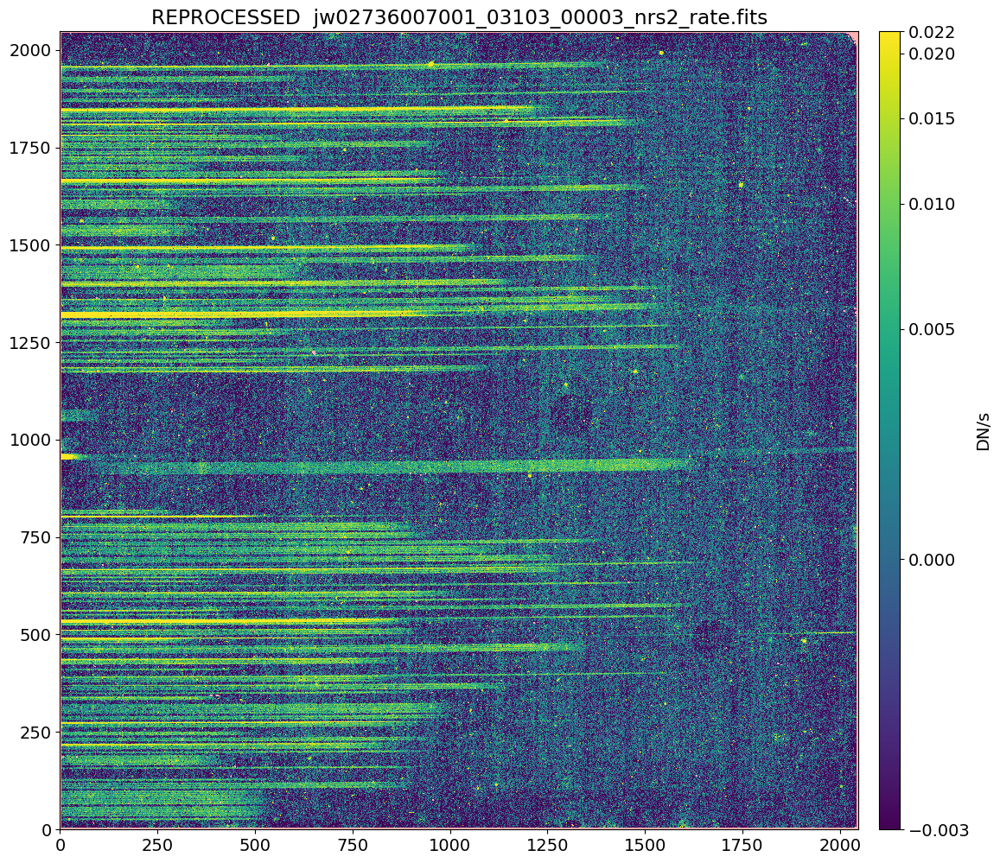

In [28]:
show_MOS_rate(rate_file, title_prefix='REPROCESSED')

## The default jump step parameters don't work as well

Compare to the data product in MAST generated using the pipeline with default parameters

In [29]:
#download_dir = 'data'
# Download the MAST data product (or load it if you've downloaded it already)
MAST_rate_file = download_jwst_files([rate_file], download_dir)[0]

data/jw02736007001_03103_00003_nrs2_rate.fits EXISTS


MAST  jw02736007001_03103_00003_nrs2_rate.fits


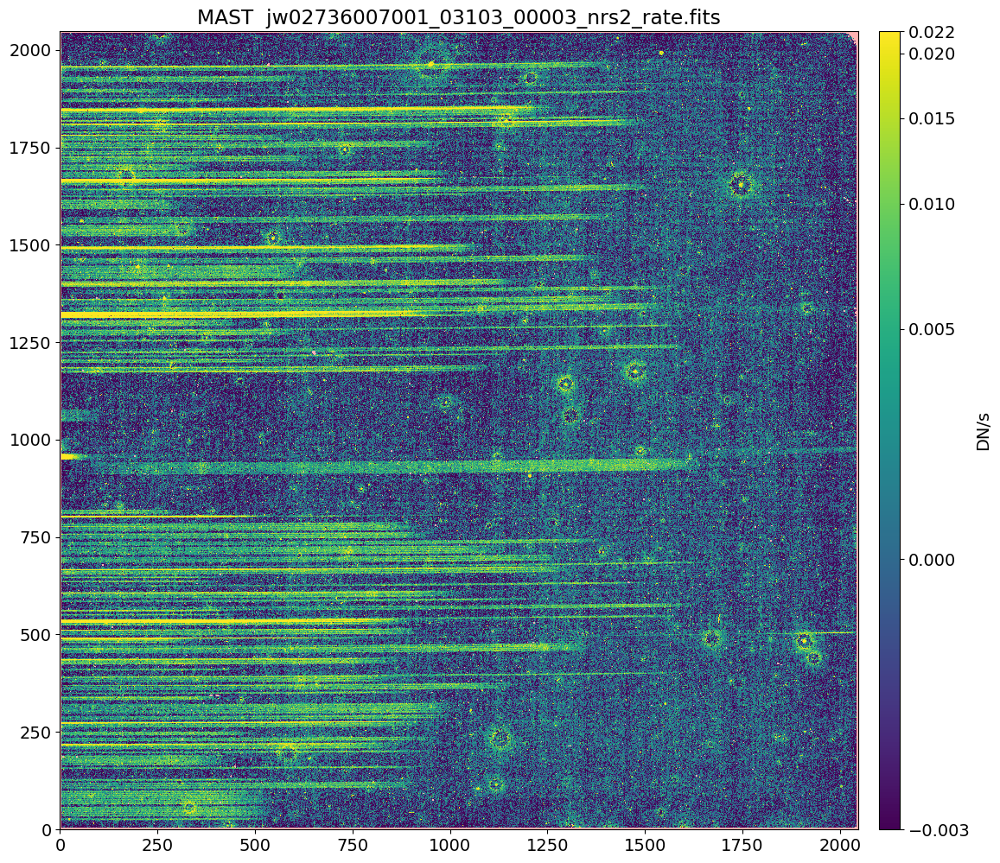

In [30]:
show_MOS_rate(MAST_rate_file, title_prefix='MAST')

# Prepare for Stage 2 `Spec2Pipeline`

Below you will:
* Select which rate files to process
* Download/create the association files that define which rate files should be proccess jointly. Here we have the standard 3 nodded exposures, so we'll subtract them from each other.
* Download the MSA metafile defining the shutters (slitlets) and sources.

### Select which rate files to process

In [31]:
# Let's just do Observation 7 (not 8)
# Can also select for '03103' in case the target acquisition data '03101' weren't weeded out above
rate_files = sorted(glob(os.path.join(output_dir, '*_rate.fits')))
rate_files = select_files(rate_files, ['007', '03103'])
rate_files

['reprocess/jw02736007001_03103_00001_nrs1_rate.fits',
 'reprocess/jw02736007001_03103_00001_nrs2_rate.fits',
 'reprocess/jw02736007001_03103_00002_nrs1_rate.fits',
 'reprocess/jw02736007001_03103_00002_nrs2_rate.fits',
 'reprocess/jw02736007001_03103_00003_nrs1_rate.fits',
 'reprocess/jw02736007001_03103_00003_nrs2_rate.fits']

## Association files

### Do you have the association files already?

In [32]:
#spec2_asn_files = glob(os.path.join(asn_dir, '*.json'))
spec2_asn_files = glob(os.path.join(output_dir, '*.json'))
spec2_asn_files = select_files(spec2_asn_files, ['o007', 'spec2'])
spec2_asn_files = sorted(spec2_asn_files)
spec2_asn_files

['reprocess/jw02736-o007_20231116t144653_spec2_00001_asn.json',
 'reprocess/jw02736-o007_20231116t144653_spec2_00002_asn.json',
 'reprocess/jw02736-o007_20231116t144653_spec2_00003_asn.json',
 'reprocess/jw02736-o007_20231116t144653_spec2_00004_asn.json',
 'reprocess/jw02736-o007_20231116t144653_spec2_00005_asn.json',
 'reprocess/jw02736-o007_20231116t144653_spec2_00006_asn.json']

### If needed, you could retrieve the association files from MAST

In [33]:
#asn_data_products = Observations.filter_products(products_list, productType='INFO', productSubGroupDescription='ASN')

### Here, we create the association files from scratch

For each rate file from each detector, there will be 3 nods. Each will have a turn being the signal labeled `science`, and the other two nodes will be subtracted as `background`. 

In [34]:
def create_spec2_asn_files(rate_files, output_dir):
    asn_files = []
    for science_index, science_rate_file in enumerate(rate_files):
        asn_data = asn_from_list.asn_from_list(rate_files, product_name=os.path.basename(science_rate_file))
        for i, member in enumerate(asn_data['products'][0]['members']):
            if i != science_index:
                member['exptype'] = 'background'

        asn_file = science_rate_file.replace('_rate.fits', '_asn.json')
        asn_file = os.path.join(output_dir, asn_file)
        asn_files.append(asn_file)
        print(asn_file)
        with open(asn_file, 'w') as outfile:
            name, serialized = asn_data.dump(format='json')
            outfile.write(serialized)
            
    return(asn_files)

In [35]:
rate_files_subset = select_files(rate_files, ['007', '03103'])
rate_files_subset = sorted(rate_files_subset)
rate_files_subset = [os.path.basename(file) for file in rate_files_subset]
rate_files_nrs1 = select_files(rate_files_subset, ['_nrs1_'])  # rate files for detector NRS1
rate_files_nrs2 = select_files(rate_files_subset, ['_nrs2_'])  # rate files for detector NRS2

In [36]:
spec2_asn_files_nrs1 = create_spec2_asn_files(rate_files_nrs1, output_dir)  # Create association files for NRS1

reprocess/jw02736007001_03103_00001_nrs1_asn.json
reprocess/jw02736007001_03103_00002_nrs1_asn.json
reprocess/jw02736007001_03103_00003_nrs1_asn.json


In [37]:
spec2_asn_files_nrs2 = create_spec2_asn_files(rate_files_nrs2, output_dir)  # Create association files for NRS2

reprocess/jw02736007001_03103_00001_nrs2_asn.json
reprocess/jw02736007001_03103_00002_nrs2_asn.json
reprocess/jw02736007001_03103_00003_nrs2_asn.json


In [38]:
spec2_asn_files = spec2_asn_files_nrs1 + spec2_asn_files_nrs2

### View contents of association files

In [39]:
# Print each association file, followed by its contents, which define the science and background files
for asn_file in spec2_asn_files:
    print('-' * 33)
    print(os.path.basename(asn_file))
    with open(asn_file, 'r') as f_obj:
        asn_file_data = json.load(f_obj)

    for member in asn_file_data['products'][0]['members']:
        print(member['expname'], member['exptype'])

---------------------------------
jw02736007001_03103_00001_nrs1_asn.json
jw02736007001_03103_00001_nrs1_rate.fits science
jw02736007001_03103_00002_nrs1_rate.fits background
jw02736007001_03103_00003_nrs1_rate.fits background
---------------------------------
jw02736007001_03103_00002_nrs1_asn.json
jw02736007001_03103_00001_nrs1_rate.fits background
jw02736007001_03103_00002_nrs1_rate.fits science
jw02736007001_03103_00003_nrs1_rate.fits background
---------------------------------
jw02736007001_03103_00003_nrs1_asn.json
jw02736007001_03103_00001_nrs1_rate.fits background
jw02736007001_03103_00002_nrs1_rate.fits background
jw02736007001_03103_00003_nrs1_rate.fits science
---------------------------------
jw02736007001_03103_00001_nrs2_asn.json
jw02736007001_03103_00001_nrs2_rate.fits science
jw02736007001_03103_00002_nrs2_rate.fits background
jw02736007001_03103_00003_nrs2_rate.fits background
---------------------------------
jw02736007001_03103_00002_nrs2_asn.json
jw02736007001_0310

In [40]:
print_dict(asn_file_data)  # view full contents of one of the files (the last one)

 asn_type : None
 asn_rule : DMS_Level3_Base
 version_id : None
 code_version : 1.13.4
 degraded_status : No known degraded exposures in association.
 program : noprogram
 constraints : No constraints
 asn_id : a3001
 target : none
 asn_pool : none
 [0]
     name : jw02736007001_03103_00003_nrs2_rate.fits
     [0]
         expname : jw02736007001_03103_00001_nrs2_rate.fits
         exptype : background
     [1]
         expname : jw02736007001_03103_00002_nrs2_rate.fits
         exptype : background
     [2]
         expname : jw02736007001_03103_00003_nrs2_rate.fits
         exptype : science


Note: association files need to be in same directory as rate files

### Retrieve the MSA METAFILE from MAST

The MSA metafile defines:  
* which MSA shutters (slitlets) are open, which sources they observe (if any), and whether they should be used for science or background in each dithered exposure
* the sources, including where they are (RA, Dec), and whether they should be treated as point sources (stellarity > 0.75) or extended (uniform illumination) for the path loss corrections

All MSA configurations may be stored in a single MSA metafile common to the observing program.

In [41]:
#if run_pipeline:
for rate_file in rate_files:
    try:
        # Download MSA metafile
        msa_file = fits.getval(rate_file, 'MSAMETFL')
        download_jwst_files([msa_file], output_dir)
    except:
        pass

reprocess/jw02736007001_01_msa.fits EXISTS
reprocess/jw02736007001_01_msa.fits EXISTS
reprocess/jw02736007001_01_msa.fits EXISTS
reprocess/jw02736007001_01_msa.fits EXISTS
reprocess/jw02736007001_01_msa.fits EXISTS
reprocess/jw02736007001_01_msa.fits EXISTS


Downloading URL https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:jwst/product/jw02736007001_01_msa.fits to reprocess/jw02736007001_01_msa.fits ... [Done]

In [42]:
hdu_list = fits.open(rate_file)
msa_metafile = hdu_list[0].header['MSAMETFL']
msa_metafile = os.path.join(output_dir, msa_metafile)
msa_hdu_list = fits.open(msa_metafile)
msa_hdu_list.info()

Filename: reprocess/jw02736007001_01_msa.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   ()      
  1  SHUTTER_IMAGE    1 ImageHDU         8   (342, 730)   int16   
  2  SHUTTER_INFO    1 BinTableHDU     33   1318R x 12C   [I, I, I, I, I, J, 1A, 6A, E, E, I, 1A]   
  3  SOURCE_INFO    1 BinTableHDU     25   119R x 8C   [J, J, 20A, 31A, D, D, 30A, D]   


If you wish to edit the MSA metafile, a detailed example notebook is forthcoming...

# Stage 2 `Spec2Pipeline`: `rate` –> `cal`, `s2d`, `x1d`  <a id='stage2'></a> 

`calwebb_spec2`
[JDox](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_spec2) •
[ReadtheDocs](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec2.html)

Run on association files defining science and background slitlets for each of 3 nod exposures  
3 exposures x 2 detectors = 6 association files  

`Spec2Pipeline` takes 7 minutes on a MacBook Pro laptop (with reference files already downloaded)

### View available options and default parameters

OPTIONAL (You'll call `Spec2Pipeline` differently below)

In [43]:
spec2pipe = Spec2Pipeline()

2024-03-28 15:07:32,773 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2024-03-28 15:07:32,774 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2024-03-28 15:07:32,775 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2024-03-28 15:07:32,776 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2024-03-28 15:07:32,776 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2024-03-28 15:07:32,777 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2024-03-28 15:07:32,778 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2024-03-28 15:07:32,780 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.
2024-03-28 15:07:32,781 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.
2024-03-28 15:07:32,781 - stpipe.Spec2Pipeline.master_background_mos.pa

In [44]:
spec2pipe.__dict__.keys()  # View top-level keywords controlling paramemters you may edit

dict_keys(['_reference_files_used', '_log_records', '_input_filename', '_input_dir', '_keywords', 'name', 'qualified_name', 'parent', 'pre_hooks', 'post_hooks', 'output_file', 'output_dir', 'output_ext', 'output_use_model', 'output_use_index', 'save_results', 'skip', 'suffix', 'search_output_file', 'save_bsub', 'fail_on_exception', 'save_wfss_esec', 'steps', 'log', 'config_file', '_pre_hooks', '_post_hooks', 'assign_wcs', 'msa_flagging', 'nsclean', 'bkg_subtract', 'imprint_subtract', 'extract_2d', 'master_background_mos', 'wavecorr', 'flat_field', 'srctype', 'straylight', 'fringe', 'residual_fringe', 'pathloss', 'barshadow', 'wfss_contam', 'photom', 'pixel_replace', 'resample_spec', 'cube_build', 'extract_1d'])

### Input parameters
* [resample](https://jwst-pipeline.readthedocs.io/en/latest/jwst/resample/arguments.html)
    * `weight_type`:
        * `ivm` pixel-based inverse read noise works best to reject outliers
        * `exptime` improves SNR, especially for bright objects (and will become the new default)

see https://jwst-docs.stsci.edu/jwst-calibration-pipeline-caveats/jwst-nirspec-mos-pipeline-caveats

In [45]:
params_spec2 = {}

# This is the current default, but that will change, so set explicitly:
params_spec2['resample_spec'] = {  
    'weight_type': 'ivm'  # pixel-based inverse read noise (vs. 'exptime' single value exposure time)
}

params_spec2

{'resample_spec': {'weight_type': 'ivm'}}

### Run `Spec2Pipeline`

In [46]:
if run_pipeline:
    for asn_file in spec2_asn_files:
        spec2_result = Spec2Pipeline.call(
            asn_file,
            save_results = True,
            output_dir = output_dir,
            steps = params_spec2
        )

## Label spectra in rate image

Draw boxes around extraction regions for each source in a RATE file, using slit information in the corresponding Spec2 CAL file. These boxes are large enough to accomodate the curved spectral traces. Neighboring boxes may overlap, even though the spectra do not. The spectra are subsequently rectified (straightened) in the S2D files, and 1D extracted in the X1D files.

In [47]:
rate_file = rate_files[-1]  # Show the last rate file, as an example
cal_file = rate_file.replace('rate', 'cal')
print(cal_file)

reprocess/jw02736007001_03103_00003_nrs2_cal.fits


In [48]:
cal_model = datamodels.open(cal_file)
#cal_model.info(max_rows=99999)  # show all contents
#cal_data = cal_model.data + 0

jw02736007001_03103_00003_nrs2_rate.fits


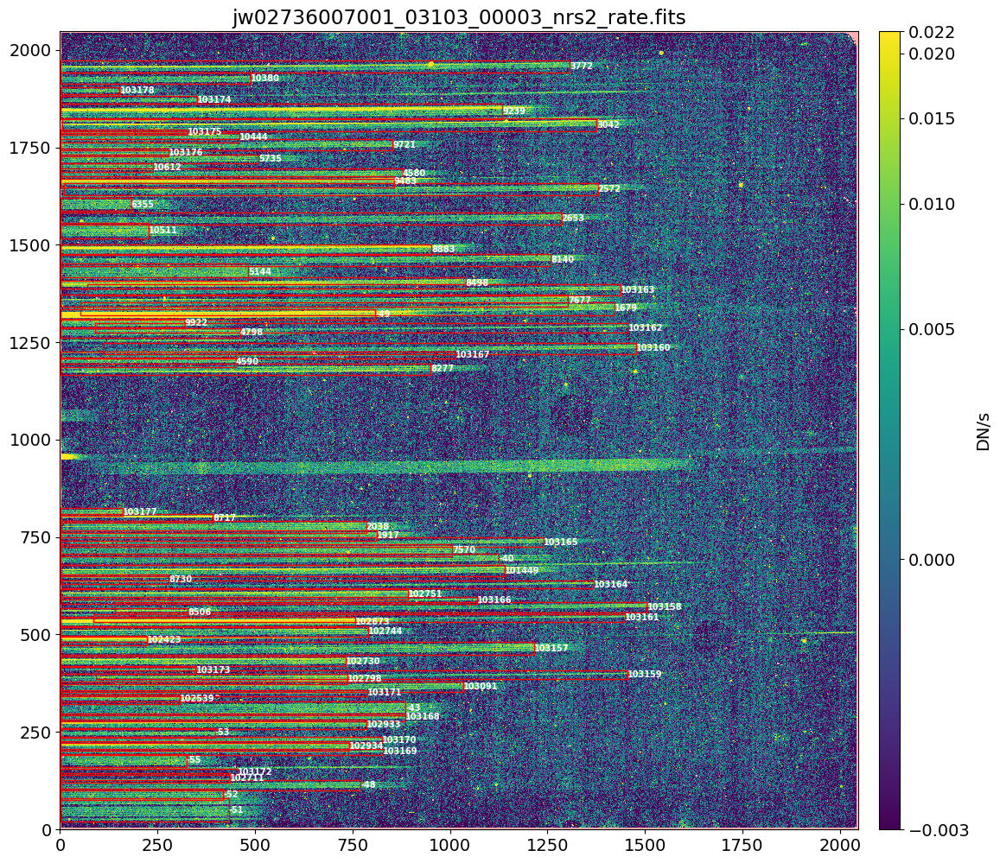

In [49]:
show_MOS_rate(rate_file, cal_model)  # , save_plot=True)

# Prepare for Stage 3

In [50]:
# Create a subdirectory for the many output files (several for each extracted source)
spec3_output_dir = os.path.join(output_dir, 'spec3')
os.makedirs(spec3_output_dir, exist_ok=True)
spec3_output_dir

'reprocess/spec3'

## Spec3 association file

### If you already have a spec3 association file, list it here

In [51]:
asn_files = glob(os.path.join(output_dir, '*.json'))
spec3_asn_file = select_files(asn_files, ['o007', 'spec3'])  # Observation 7
# Observation 8 is similar. Could do separately. Or could combine both observations.
spec3_asn_file

'reprocess/jw02736-o007_20231116t144653_spec3_00001_asn.json'

### Here, we create the association file from scratch

This association file will simply list all the CAL files. They will all be processed by Spec3, combining all exposures and detectors into drizzled spectra for each science target.

In [52]:
# Print list of CAL files to use in association
cal_files = sorted(glob(os.path.join(output_dir, '*_cal.fits')))
cal_files = [os.path.basename(file) for file in cal_files]
cal_files

['jw02736007001_03103_00001_nrs1_cal.fits',
 'jw02736007001_03103_00001_nrs2_cal.fits',
 'jw02736007001_03103_00002_nrs1_cal.fits',
 'jw02736007001_03103_00002_nrs2_cal.fits',
 'jw02736007001_03103_00003_nrs1_cal.fits',
 'jw02736007001_03103_00003_nrs2_cal.fits']

In [53]:
# Name the file you will create
cal_file = os.path.basename(cal_files[0])
words = cal_file.split('_')
spec3_asn_file = words[0] + '_' + words[1] + '_spec3_asn.json'
spec3_asn_file

'jw02736007001_03103_spec3_asn.json'

In [54]:
# Create the association
asn_data = asn_from_list.asn_from_list(cal_files, product_name=os.path.basename(spec3_asn_file))

In [55]:
# Save association json file
with open(spec3_asn_file, 'w') as outfile:
    name, serialized = asn_data.dump(format='json')
    outfile.write(serialized)

### View contents of association files

In [56]:
with open(spec3_asn_file) as f_obj:
    asn_data = json.load(f_obj)
    spec2_cal_files = []
    for member in asn_data['products'][0]['members']:
        if member['exptype'] == 'science':
            spec2_cal_file = member['expname']
            spec2_cal_files.append(spec2_cal_file)
            print(spec2_cal_file)

jw02736007001_03103_00001_nrs1_cal.fits
jw02736007001_03103_00001_nrs2_cal.fits
jw02736007001_03103_00002_nrs1_cal.fits
jw02736007001_03103_00002_nrs2_cal.fits
jw02736007001_03103_00003_nrs1_cal.fits
jw02736007001_03103_00003_nrs2_cal.fits


In [57]:
print_dict(asn_data) # View full contents of one of the spec3 association file
# Note all files are science. They will all be combined in this stage. 
# Nodded backgrounds were subtracted already by Spec2.

 asn_type : None
 asn_rule : DMS_Level3_Base
 version_id : None
 code_version : 1.13.4
 degraded_status : No known degraded exposures in association.
 program : noprogram
 constraints : No constraints
 asn_id : a3001
 target : none
 asn_pool : none
 [0]
     name : jw02736007001_03103_spec3_asn.json
     [0]
         expname : jw02736007001_03103_00001_nrs1_cal.fits
         exptype : science
     [1]
         expname : jw02736007001_03103_00001_nrs2_cal.fits
         exptype : science
     [2]
         expname : jw02736007001_03103_00002_nrs1_cal.fits
         exptype : science
     [3]
         expname : jw02736007001_03103_00002_nrs2_cal.fits
         exptype : science
     [4]
         expname : jw02736007001_03103_00003_nrs1_cal.fits
         exptype : science
     [5]
         expname : jw02736007001_03103_00003_nrs2_cal.fits
         exptype : science


# Stage 3 `Spec3Pipeline`: combine exposures –> `s2d`, `x1d` for each target <a id='stage3'></a> 

`calwebb_spec3`
[JDox](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_spec3) •
[ReadtheDocs](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec3.html)

### View available options and default parameters

OPTIONAL (You'll call `Spec3Pipeline` differently below)

In [58]:
spec3pipe = Spec3Pipeline()

2024-03-28 15:07:49,103 - stpipe.Spec3Pipeline - INFO - Spec3Pipeline instance created.
2024-03-28 15:07:49,104 - stpipe.Spec3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.
2024-03-28 15:07:49,105 - stpipe.Spec3Pipeline.master_background - INFO - MasterBackgroundStep instance created.
2024-03-28 15:07:49,106 - stpipe.Spec3Pipeline.mrs_imatch - INFO - MRSIMatchStep instance created.
2024-03-28 15:07:49,107 - stpipe.Spec3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.
2024-03-28 15:07:49,108 - stpipe.Spec3Pipeline.resample_spec - INFO - ResampleSpecStep instance created.
2024-03-28 15:07:49,109 - stpipe.Spec3Pipeline.cube_build - INFO - CubeBuildStep instance created.
2024-03-28 15:07:49,110 - stpipe.Spec3Pipeline.extract_1d - INFO - Extract1dStep instance created.
2024-03-28 15:07:49,111 - stpipe.Spec3Pipeline.photom - INFO - PhotomStep instance created.
2024-03-28 15:07:49,112 - stpipe.Spec3Pipeline.combine_1d - INFO - Combine1dStep instance

In [59]:
spec3pipe.__dict__.keys()  # List top-level keywords for parameters you may control

dict_keys(['_reference_files_used', '_log_records', '_input_filename', '_input_dir', '_keywords', 'name', 'qualified_name', 'parent', 'pre_hooks', 'post_hooks', 'output_file', 'output_dir', 'output_ext', 'output_use_model', 'output_use_index', 'save_results', 'skip', 'suffix', 'search_output_file', 'steps', 'log', 'config_file', '_pre_hooks', '_post_hooks', 'assign_mtwcs', 'master_background', 'mrs_imatch', 'outlier_detection', 'resample_spec', 'cube_build', 'extract_1d', 'photom', 'combine_1d', 'spectral_leak'])

### Input parameters

In [60]:
params_spec3 = {}
params_spec3['outlier_detection'] = {'skip' : False} # Flag outlier bad pixels and cosmic rays in DQ array of each input image
params_spec3['resample_spec']     = {'weight_type' : 'ivm'}  # pixel-based inverse read noise (vs. 'exptime' single value exposure time)
params_spec3['extract_1d']        = {'use_source_posn' : 'True'} # extraction rows based on expected source position
params_spec3

{'outlier_detection': {'skip': False},
 'resample_spec': {'weight_type': 'ivm'},
 'extract_1d': {'use_source_posn': 'True'}}

In [61]:
spec3_asn_file

'jw02736007001_03103_spec3_asn.json'

### Run `Spec3Pipeline`

In [62]:
if run_pipeline:
    spec3_result = Spec3Pipeline.call(
        spec3_asn_file,
        save_results = True,
        output_dir = spec3_output_dir,
        steps = params_spec3
    )

## Show spectrum result

In [63]:
def show_MOS_spectrum(s2d_model, x1d_model, source_id=None, cmap='RdBu', bad_color='w',
                     ystart=None, ystop=None, expand_wavelength_gap=True):
    # 2D spectrum
    #if source_id:  # s2d has all the objects; extract the one with source_id
    if 'slits' in list(s2d_model):  # s2d has all the objects; extract the one with source_id
        source_ids = [slit.source_id for slit in s2d_model.slits]
        i_slit = source_ids.index(source_id)
        slit_model = s2d_model.slits[i_slit]
    else:  # s2d only has one object
        slit_model = s2d_model
        i_slit = 0
        
    s2d_data = slit_model.data + 0  # load and make copy
    s2d_data = np.where(slit_model.err, s2d_data, np.nan)  # Replace zeros with nan where there is no data

    # 1D spectrum
    x1d_wave    = x1d_model.spec[i_slit].spec_table.WAVELENGTH
    x1d_flux    = x1d_model.spec[i_slit].spec_table.FLUX
    x1d_fluxerr = x1d_model.spec[i_slit].spec_table.FLUX_ERROR
    if np.sum(np.isnan(x1d_fluxerr)) == len(x1d_fluxerr):  # fluxerr all nan?? pipeline bug
        x1d_flux = np.where(x1d_flux, x1d_flux, np.nan)  # Replace zeros with nan where there is no data
    else:
        x1d_flux = np.where(np.isnan(x1d_fluxerr), np.nan, x1d_flux)  # Replace zeros with nan where there is no data
    #x1dflux = np.where(x1dfluxerr, x1dflux, np.nan)  # Replace zeros with nan where there is no data
    
    if expand_wavelength_gap:
        dx1d_wave = x1d_wave[1:] - x1d_wave[:-1]
        igap = np.argmax(dx1d_wave)
        dx1d_max = np.max(dx1d_wave)
        dx_replace = (dx1d_wave[igap-1] + dx1d_wave[igap+1]) / 2.
        num_fill = int(np.round(dx1d_max / dx_replace))
        print("Expanding wavelength gap %.2f -- %.2f microns" % (x1d_wave[igap], x1d_wave[igap+1]))
        
        if num_fill > 1:  # There is a gap to fill
            wave_fill = np.mgrid[x1d_wave[igap] : x1d_wave[igap+1] : (num_fill+1)*1j]
            x1d_wave = np.concatenate([x1d_wave[:igap+1], wave_fill[1:-1], x1d_wave[igap+1:]])

            num_rows, num_waves = s2d_data.shape
            s2d_fill = np.zeros(shape=(num_rows,num_fill-1)) * np.nan
            s2d_data = np.concatenate([s2d_data[:,:igap+1], s2d_fill, s2d_data[:,igap+1:]], axis=1)

            x1d_fill = np.zeros(shape=(num_fill-1)) * np.nan
            x1d_flux    = np.concatenate([x1d_flux[:igap+1],    x1d_fill, x1d_flux[igap+1:]])        
            x1d_fluxerr = np.concatenate([x1d_fluxerr[:igap+1], x1d_fill, x1d_fluxerr[igap+1:]])        

    wave_min, wave_max = x1d_wave[0], x1d_wave[-1]
    eps = 1e-7
    #major_tick_interval = 0.5
    major_tick_interval = 0.2
    xtick_min = np.ceil((wave_min - eps) / major_tick_interval) * major_tick_interval
    xticks = np.arange(xtick_min, wave_max, major_tick_interval)
    #xticks = np.append(xticks, [5.2])
    num_waves = len(x1d_wave)
    xtick_pos = np.interp(xticks, x1d_wave, np.arange(num_waves))
    xtick_labels = ['%.1f' % xtick for xtick in xticks]
    
    #xtick_labels = [label.replace('4.8', '') for label in xtick_labels]  # remove 4.8
    # Remove any tick labels that are too close and would overlap
    for i in range(len(xtick_pos)-1):
        dx = xtick_pos[i+1] - xtick_pos[i]
        if dx < 40:
            xtick_labels[i] = ''
    
    #for label in xtick_labels: print(label, ' ', end='')

    # Make Figure
    fig, (ax2d, ax1d) = plt.subplots(2, 1, figsize=(15,8), height_ratios=[1,3], squeeze=True, sharex=True)
    cmap = matplotlib.colormaps[cmap]
    cmap.set_bad(bad_color, 1.)

    sigma_clipped_data = sigma_clip(s2d_data, sigma=5, maxiters=3)
    ymin = np.min(sigma_clipped_data)
    #ymin = 0.2 * ymin
    ymax = np.max(sigma_clipped_data)
    #ymin = -ymax  # center range about zero; but there may be some bias positive or negative

    #ymax = 2 * np.nanpercentile(s2d_data, 90)
    #ymin = -0.2 * ymax
    
    # plot the rectified 2D spectrum
    #norm = simple_norm(s2dsci, 'linear', min_percent=2, max_percent=99.9)
    #norm = simple_norm(s2d_data, 'asinh', min_percent=min_percent, max_percent=max_percent)
    norm = simple_norm(s2d_data, 'linear', min_cut=ymin, max_cut=ymax)
    print('s2d range:', norm.vmin, norm.vmax)
    im = ax2d.imshow(s2d_data, origin='lower', cmap=cmap, aspect='auto', norm=norm, interpolation='nearest')
    num_cross, num_dispersion = s2d_data.shape
    width_1d = 3
    ny, nx = s2d_data.shape
    ax2d.yaxis.set_ticks_position('both')
    #ax2d.axhline((ny-1)/2., c='w', lw=0.5, alpha=0.5, ls='--')
    if ystart:
        for y in ystart, ystop:
            #ax2d.axhline(y, c='w', lw=0.5, alpha=0.5, ls='--')
            ax2d.axhline(y, c='m', lw=0.5)
        ax2d.set_yticks([0, ystart, ystop, ny-1])
        if 1:
            extract_width = 8
            ystart0 = ny//2 - extract_width/2
            ystop0  = ny//2 + extract_width/2 -1
            for y in ystart0, ystop0:
                ax2d.axhline(y, c='0.50', lw=0.5, ls='--', dashes=(10,10))
    else:
        ax2d.set_yticks([0, (ny-1)/2., ny-1])
    
    # plot the 1D extraction  x1d vs. indices, same as s2d array above
    ax1d.axhline(0, c='0.50', lw=0.5, alpha=0.66, ls='-')
    ax1d.step(np.arange(num_waves), x1d_fluxerr, lw=0.5, c='r', alpha=0.66)
    ax1d.step(np.arange(num_waves), x1d_flux, lw=1)
    ax1d.set_xlim(0, num_waves)
    ax1d.yaxis.set_ticks_position('both')

    #ax1d.set_ylim(-2e-6, 2e-5)
    #ax1d.set_ylim(ymin, ymax)
    
    title = 'S2D  ' + os.path.basename(s2d_model.meta.filename) 
    title += '  slit %d'   % slit_model.slitlet_id
    title += '  source %d' % slit_model.source_id
    ax2d.set_title(title)
    ax1d.set_title('X1D Flux (Jy)')
    plt.xticks(xtick_pos, xtick_labels)
    plt.xlabel('wavelength (microns)');
    
#show_MOS_spectrum(s2d_model, x1d_model, source_id)

In [64]:
source_id = 6355  # Select source to inspect

In [65]:
#output_dir = 'reprocess'
s2d_files = glob(os.path.join(spec3_output_dir, '*_s2d.fits'))
s2d_file  = select_files(s2d_files, ['s%05d' % source_id])
s2d_file

'reprocess/spec3/jw02736-o007_s06355_nirspec_f290lp-g395m_s2d.fits'

In [66]:
s2d_model = datamodels.open(s2d_file)
#s2d_model.info(max_rows=99999)  # show all contents
#s2d_data = s2d_model.data + 0

In [67]:
# Load 1D extraction
x1d_file = s2d_file.replace('s2d', 'x1d')
print(x1d_file)
x1d_model = datamodels.open(x1d_file)
#x1d_model.info(max_rows=99999)  # show all contents

reprocess/spec3/jw02736-o007_s06355_nirspec_f290lp-g395m_x1d.fits


2024-03-28 15:07:49,543 - stpipe - WARNING - Input data contains invalid values (NaNs or infs), which were automatically clipped.


Expanding wavelength gap 4.70 -- 4.96 microns
s2d range: -0.7664494514465332 0.7519416213035583


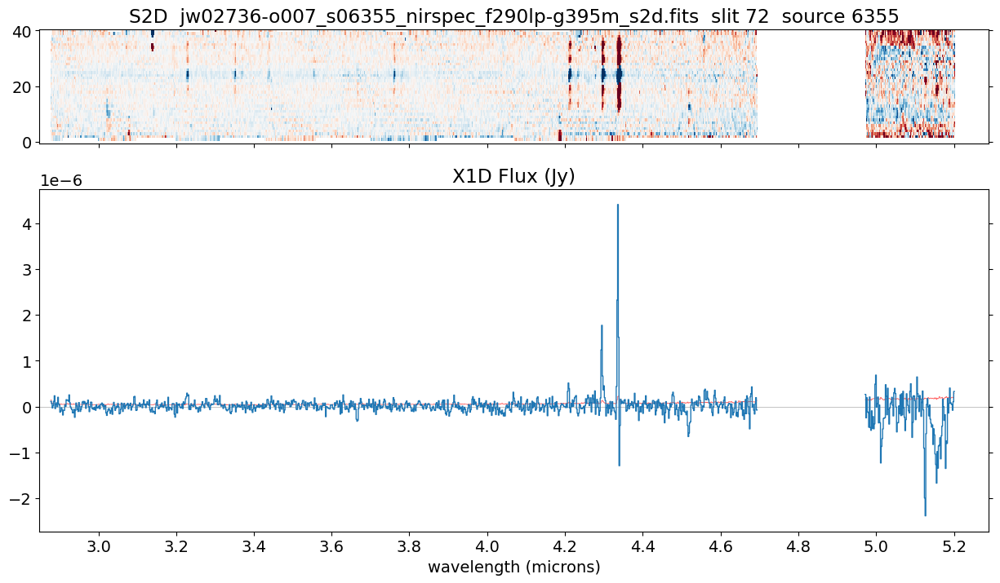

In [68]:
show_MOS_spectrum(s2d_model, x1d_model, source_id)

# `Extract1dStep`: Adjust 2D –> 1D extraction

[extract1d](https://jwst-pipeline.readthedocs.io/en/latest/jwst/extract_1d) • 
[Extract1dStep](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.extract_1d.Extract1dStep.html) • 
[Description](https://jwst-pipeline.readthedocs.io/en/latest/jwst/extract_1d/description.html#extraction-for-2d-slit-data) • 
[Editing JSON reference file](https://jwst-pipeline.readthedocs.io/en/latest/jwst/extract_1d/reference_files.html#editing-json-reference-file-format-for-non-ifu-data)

OPTIONAL to modify which rows in S2D (2D spectrum) are used for extraction to X1D (1D spectrum). 

(Note the X1D file does not save information about which rows were used. This information is printed as output during execution but not saved.)

Define extraction region in `.json` file, then run `Extract1dStep`  
Output file will end in `_extract1dstep.fits`

`extract_width` takes priority over `ystart` and `ystop` for the extraction width,   
but `ystart` and `ystop` will still be used to define the centering of the extraction region in the cross-dispersion direction.

All of these values are zero-indexed integers. The start and stop limits are inclusive.

The default EXTRACT1D reference file is found in CRDS. The user can download this file from https://jwst-crds.stsci.edu, modify the contents, and then use this modified file in `Extract1dStep` by specifying this modified reference file with the `override_extract1d` option


### See also

* [Adjusting the extraction region](https://github.com/spacetelescope/jwst-caveat-examples/blob/main/NIRSPEC_General/nrs_recenter_extraction_workaround.ipynb)
* [MOSViz interactive extraction](https://spacetelescope.github.io/jdat_notebooks/notebooks/mos_spectroscopy_advanced/MOSspec_advanced.html)
* [Optimal extraction](https://spacetelescope.github.io/jdat_notebooks/notebooks/optimal_extraction/Spectral_Extraction-static.html)
* [msaexp optimal extraction](https://github.com/gbrammer/msaexp/blob/d7368560cf465a0828e942454cfcc0bbe6870278/msaexp/drizzle.py#L869C19-L869C19)


### The default `extract1d` parameter reference file may be retrieved from CRDS

In [69]:
#default_extract1d_json_file = 'jwst_nirspec_extract1d_0003.json'  # could find this on https://jwst-crds.stsci.edu

#crds_context = crds.get_default_context()
# Download the reference file, or find it in your cache
#default_extract1d_json_file = crds.getreferences(s2d_header, reftypes=['extract1d'], context=crds_context, observatory='jwst')['extract1d']

In [70]:
# List any extract1d JSON files created already
extract1d_json_files = glob('*extract1d*.json')
extract1d_json_files

['jwst_nirspec_extract1d_0003.json',
 'jwst_nirspec_extract1d_default.json',
 'jwst_nirspec_extract1d_new3.json',
 'jwst_nirspec_extract1d_custom.json',
 'jwst_nirspec_extract1d_new.json',
 'jwst_nirspec_extract1d_new 2.json']

### Here we create an `extract1d` JSON file from scratch

In [71]:
extract1d_json_data = {'reftype':'EXTRACT1D', 'instrument':'NIRSPEC', 'telescope':'JWST', 'exp_type':'NRS_MSASPEC'}
extract1d_json_data['apertures'] = [{'id':'ANY', 'region_type':'target', 'independent_var':'pixel', 
                                     'bkg_order':0, 'dispaxis':1,
                                     'extract_width':8,
                                   }]

if run_pipeline:
    json_object = json.dumps(extract1d_json_data, indent=4)
    default_extract1d_json_file = 'jwst_nirspec_extract1d_default.json'
    with open(default_extract1d_json_file, "w") as outfile:
        outfile.write(json_object)
    
    #JSON(extract1d_json_data, expanded=True)
    print_dict(extract1d_json_data)

### Define the extraction region

In [72]:
#ycenter = 15  # for most sources with standard 3-slitlet nods
ycenter = 25  # here we have a larger 5-slitlet extraction
extract_width = 8  # 6
#extract_width = extract1d_json_data['apertures'][0]['extract_width']  # use default extraction width
ystart = ycenter - extract_width // 2
ystop = ystart + extract_width - 1
extract1d_json_data['apertures'][0]['ystart'] = ystart
extract1d_json_data['apertures'][0]['ystop']  = ystop
print(ystart, ystop)

21 28


In [73]:
extract1d_json_data['apertures'][0]  # List extract1d parameter values

{'id': 'ANY',
 'region_type': 'target',
 'independent_var': 'pixel',
 'bkg_order': 0,
 'dispaxis': 1,
 'extract_width': 8,
 'ystart': 21,
 'ystop': 28}

In [74]:
# Create new JSON file
custom_extract1d_json_file = 'jwst_nirspec_extract1d_custom.json'
#if run_pipeline:
json_object = json.dumps(extract1d_json_data, indent=4)
with open(custom_extract1d_json_file, "w") as outfile:
    outfile.write(json_object)
        
custom_extract1d_json_file

'jwst_nirspec_extract1d_custom.json'

In [75]:
# Show contents of extract1d json file
with open(custom_extract1d_json_file) as f_obj:
    extract1d_json_data = json.load(f_obj)
    
#extract1d_json_data
#JSON(extract1d_json_data, expanded=True)
print_dict(extract1d_json_data)

 reftype : EXTRACT1D
 instrument : NIRSPEC
 telescope : JWST
 exp_type : NRS_MSASPEC
 [0]
     id : ANY
     region_type : target
     independent_var : pixel
     bkg_order : 0
     dispaxis : 1
     extract_width : 8
     ystart : 21
     ystop : 28


### Run `Extract1d`

In [76]:
# Run extract1d with parameters defined above
if run_pipeline:
    extract1d_result = Extract1dStep.call(s2d_file,
                                use_source_posn=False, 
                                apply_apcorr=False,
                                override_extract1d = custom_extract1d_json_file,
                                save_results=True, output_dir=spec3_output_dir)

# Output file ends in _extract1dstep (not _x1d); okay to save in same output directory
# jw02736-o007_s06355_nirspec_f290lp-g395m_extract1dstep.fits

In [77]:
extract_x1d_file = s2d_file.replace('s2d', 'extract1dstep')
print(extract_x1d_file)
extract1d_result = datamodels.open(extract_x1d_file)

reprocess/spec3/jw02736-o007_s06355_nirspec_f290lp-g395m_extract1dstep.fits


### Show the result

2024-03-28 15:07:49,874 - stpipe - WARNING - Input data contains invalid values (NaNs or infs), which were automatically clipped.


Expanding wavelength gap 4.70 -- 4.96 microns
s2d range: -0.7664494514465332 0.7519416213035583


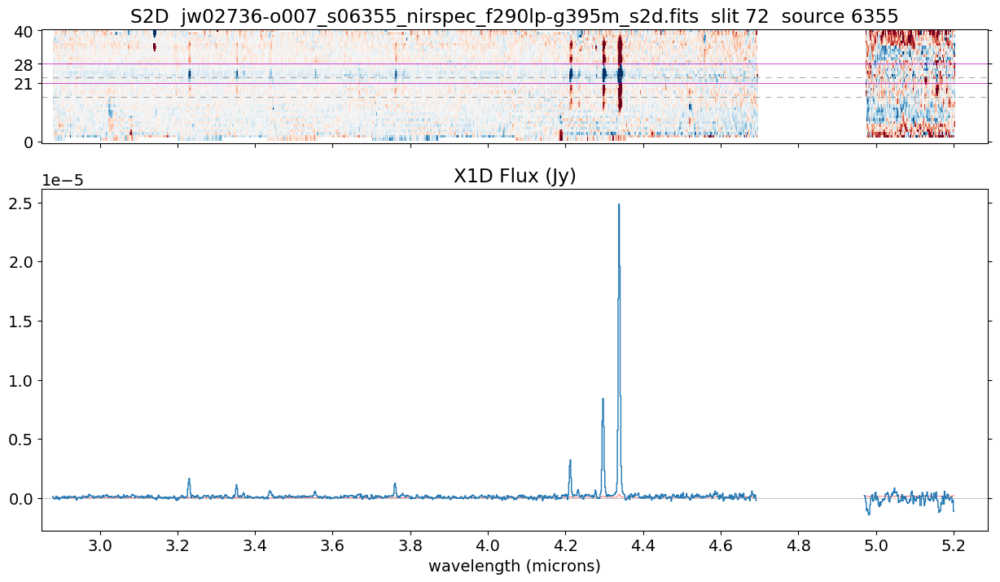

In [78]:
#show_MOS_spectrum(s2d_model, x1d_model, source_id)
show_MOS_spectrum(s2d_model, extract1d_result, ystart=ystart, ystop=ystop)

### Compare spectra from MAST, pipeline reprocessing, and updated 1D extraction

In [79]:
s2d_file

'reprocess/spec3/jw02736-o007_s06355_nirspec_f290lp-g395m_s2d.fits'

In [80]:
# Load original 2D and 1D spectra
x1d_file = s2d_file.replace('s2d', 'x1d')
s2d_model = datamodels.open(s2d_file)
x1d_model = datamodels.open(x1d_file)
x1d_wave = x1d_model.spec[0].spec_table.WAVELENGTH
x1d_flux = x1d_model.spec[0].spec_table.FLUX

In [81]:
# Load new 1D extraction
extract1d_file = s2d_file.replace('s2d', 'extract1dstep')
extract1d_model = datamodels.open(extract1d_file)
extract1d_wave = extract1d_model.spec[0].spec_table.WAVELENGTH
extract1d_flux = extract1d_model.spec[0].spec_table.FLUX

In [82]:
# Download default pipeline results from MAST for comparison
MAST_s2d_file = download_jwst_files([s2d_file], download_dir)[0]
MAST_x1d_file = download_jwst_files([x1d_file], download_dir)[0]
MAST_s2d_model = datamodels.open(MAST_s2d_file)
MAST_x1d_model = datamodels.open(MAST_x1d_file)
x1d_wave_MAST = MAST_x1d_model.spec[0].spec_table.WAVELENGTH
x1d_flux_MAST = MAST_x1d_model.spec[0].spec_table.FLUX

data/jw02736-o007_s06355_nirspec_f290lp-g395m_s2d.fits EXISTS
data/jw02736-o007_s06355_nirspec_f290lp-g395m_x1d.fits EXISTS


In [83]:
# Define wavelength grid and ticks
num_waves = len(x1d_wave)
wave_min, wave_max = x1d_wave[0], x1d_wave[-1]
eps = 1e-7
#major_tick_interval = 0.5
major_tick_interval = 0.2
xtick_min = np.ceil((wave_min - eps) / major_tick_interval) * major_tick_interval
xticks = np.arange(xtick_min, wave_max, major_tick_interval)
#xticks = np.append(xticks, [5.2])
num_waves = len(x1d_wave)
xtick_pos = np.interp(xticks, x1d_wave, np.arange(num_waves))
xtick_labels = ['%.1f' % xtick for xtick in xticks]

### Compare MAST (default pipeline) vs. pipeline reprocessing

The results are fairly similar. A few noise peaks are suppressed in the reprocessed data.

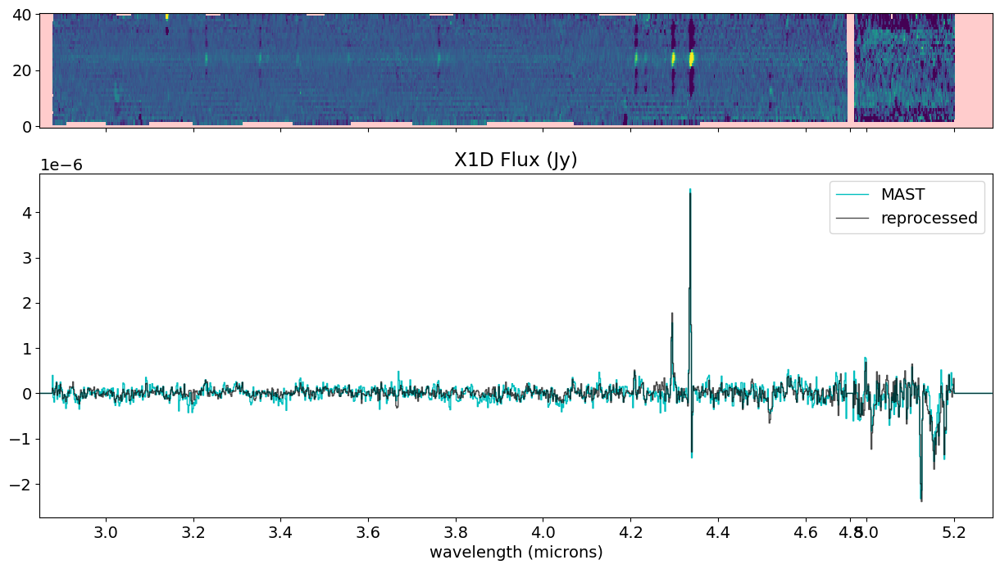

In [84]:
fig, (ax2d, ax1d) = plt.subplots(2, 1, figsize=(15,8), height_ratios=[1,3], squeeze=True, sharex=True)

# plot the rectified 2D spectrum
#norm = simple_norm(s2dsci, 'linear', min_percent=10, max_percent=99.9)
s2d_data = np.where(s2d_model.err, s2d_model.data, np.nan)  # Replace zeros with nan where there is no data
norm = simple_norm(s2d_data, 'asinh', min_percent=2, max_percent=99.95)
cmap = matplotlib.colormaps['viridis']
cmap.set_bad((1,0.8,0.8), 1.)
im = ax2d.imshow(s2d_data, origin='lower', cmap=cmap, aspect='auto', norm=norm, interpolation='nearest')

ax1d.step(np.arange(num_waves), x1d_flux_MAST,  lw=1, c='c', label='MAST')
ax1d.step(np.arange(num_waves), x1d_flux,       lw=1, c='k', label='reprocessed', alpha=0.7)
#xlim = ax1d.get_xlim()
ax1d.set_xlim(0, num_waves)
ax1d.set_title('X1D Flux (Jy)')

plt.xticks(xtick_pos, xtick_labels)
plt.xlabel('wavelength (microns)')
plt.legend();

### Compare updated 1D extraction

For this source with 5 slitlets, the default extraction is centered, missing some of the spectrum, which is offset vertically. The manually adjusted 1D extraction rows yield significantly more flux.

**Sources with the standard 3 slitlets would not show such significant improvement compared to the MAST default pipeline products.**

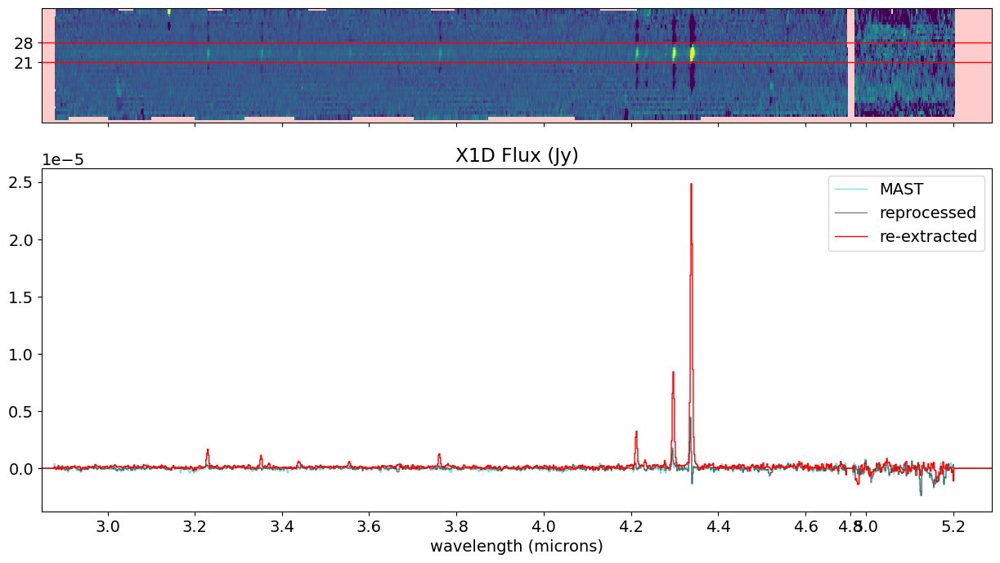

In [85]:
fig, (ax2d, ax1d) = plt.subplots(2, 1, figsize=(15,8), height_ratios=[1,3], squeeze=True, sharex=True)

# plot the rectified 2D spectrum
#norm = simple_norm(s2dsci, 'linear', min_percent=10, max_percent=99.9)
s2d_data = np.where(s2d_model.err, s2d_model.data, np.nan)  # Replace zeros with nan where there is no data
norm = simple_norm(s2d_data, 'asinh', min_percent=2, max_percent=99.95)
cmap = matplotlib.colormaps['viridis']
cmap.set_bad((1,0.8,0.8), 1.)
im = ax2d.imshow(s2d_data, origin='lower', cmap=cmap, aspect='auto', norm=norm, interpolation='nearest')

ax1d.step(np.arange(num_waves), x1d_flux_MAST,  lw=1, c='c', label='MAST',  alpha=0.5)
ax1d.step(np.arange(num_waves), x1d_flux,       lw=1, c='k', label='reprocessed',  alpha=0.5)
ax1d.step(np.arange(num_waves), extract1d_flux, lw=1, c='r', label='re-extracted', alpha=1)
#xlim = ax1d.get_xlim()
ax1d.set_xlim(0, num_waves)
ax1d.set_title('X1D Flux (Jy)')

ax2d.set_yticks([ystart, ystop])
for y in ystart, ystop:
    ax2d.axhline(y, c='r', alpha=1, lw=1, ls='-')

plt.xticks(xtick_pos, xtick_labels)
plt.xlabel('wavelength (microns)')
plt.legend();

# Authors

Dan Coe (dcoe@stsci.edu) with many contributions from others on the NIRSpec team, including Elena Manjavacas, Peter Zeidler, Kayli Glidic, Melanie Clarke, James Muzerrole, Nikolay Nikolov, Chris Hayes, and Alaina Henry who designed the ERO NIRSpec observations